In [109]:
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns 
import os 
import matplotlib

In [82]:
df_train = pd.read_csv('target_distribution_train.csv')

In [53]:
df_train.columns

Index(['tile_pre', 'tile_post', 'targets', 'background', 'building', 'intact',
       'damaged', 'destroyed', 'background_ratio', 'building_ratio',
       'intact_ratio', 'damaged_ratio', 'destroyed_ratio',
       'intact_building_ratio', 'damaged_building_ratio',
       'destroyed_building_ratio', 'place', 'disaster'],
      dtype='object')

**DISASTER DISTRIBUTION** 

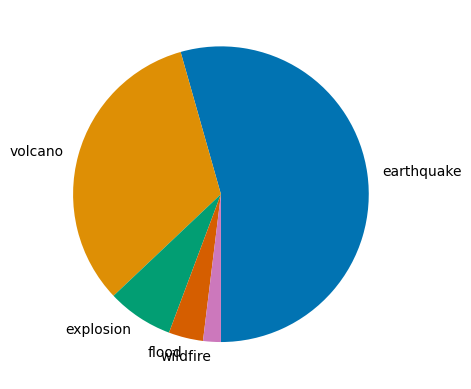

In [54]:
disaster = df_train['disaster'].value_counts()
fig, ax = plt.subplots()
colors = sns.color_palette("colorblind", len(disaster))
ax.pie(disaster, labels=disaster.index, startangle=270, colors=colors)
plt.show()

**General information on class distribution**

In [56]:
df_train[['background_ratio']].describe()

,background_ratio
count,2890.000000
mean,0.848492
std,0.177805
min,0.113316
25%,0.729347
50%,0.931191
75%,0.998512
max,1.000000


- 2890 training tiles 
- average 85% background 15% building
- median: 90% background 06% building 

=> many tiles with large amount of background pixels 

=> only little number of tiles with large amount of building pixels (max 88%)


In [5]:
df_train[['intact_building_ratio', 'damaged_building_ratio', 'destroyed_building_ratio']].describe()

,intact_building_ratio,damaged_building_ratio,destroyed_building_ratio
count,2298.000000,2298.000000,2298.000000
mean,0.885611,0.034758,0.079631
std,0.273257,0.123978,0.239460
min,0.000000,0.000000,0.000000
25%,0.964930,0.000000,0.000000
50%,1.000000,0.000000,0.000000
75%,1.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000


- in 25% of the tiles are 96% of the building pixels are intact -> no damage at all 
- in 50% of the tiles 100% of the building pixels are intact -> no damage at all 
- there are tiles with all buildings destroy 
- there are tiles with all buildings damaged 
- there are tiles with all buildings intact (see above)

- average ratio of damaged buildings : 3% 
- average ratio of destroyed buildings : 7% 

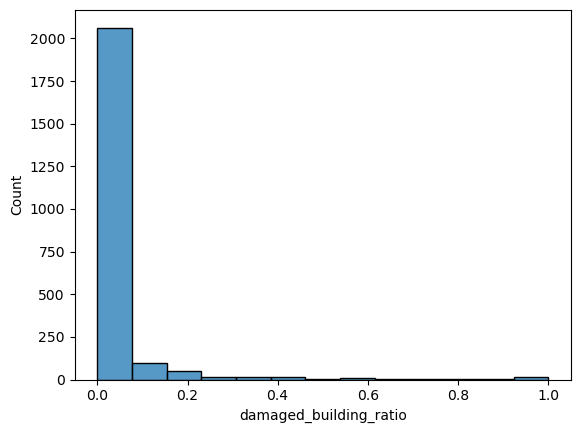

In [9]:
sns.histplot(df_train['damaged_building_ratio'])
plt.show()

<Axes: xlabel='destroyed_building_ratio', ylabel='Count'>

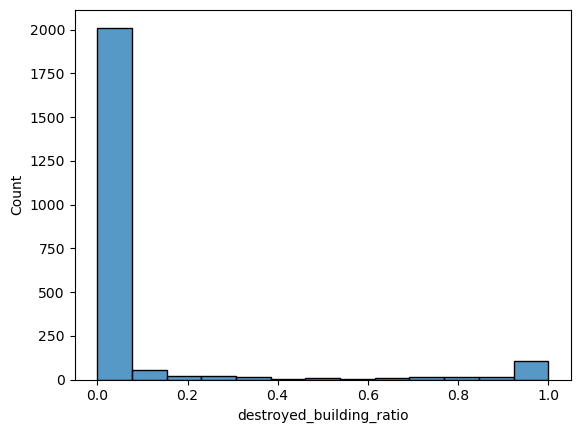

In [7]:
sns.histplot(df_train['destroyed_building_ratio'])

In [9]:
df_train.groupby('disaster')[['intact_building_ratio']].describe()

intact_building_ratio                                          \
                           count      mean       std       min       25%   
disaster                                                                   
earthquake                1253.0  0.952579  0.115939  0.146923  0.966510   
explosion                  196.0  0.934209  0.196731  0.000000  1.000000   
flood                       98.0  0.717356  0.431071  0.000000  0.170820   
volcano                    695.0  0.810544  0.374275  0.000000  1.000000   
wildfire                    56.0  0.443205  0.385275  0.007074  0.072981   

                                     
                 50%       75%  max  
disaster                             
earthquake  1.000000  1.000000  1.0  
explosion   1.000000  1.000000  1.0  
flood       1.000000  1.000000  1.0  
volcano     1.000000  1.000000  1.0  
wildfire    0.320089  0.824638  1.0

- earthquake and explosion -> most of the buildings are intact
- highest damaged or destruction for wildfire 
- flood, volcano, flood with high standard deviations! 

In [10]:
df_train.groupby('disaster')[['damaged_building_ratio']].describe()

damaged_building_ratio                                          \
                            count      mean       std  min  25%       50%   
disaster                                                                    
earthquake                 1253.0  0.029101  0.076444  0.0  0.0  0.000000   
explosion                   196.0  0.049086  0.148261  0.0  0.0  0.000000   
flood                        98.0  0.256851  0.402260  0.0  0.0  0.000000   
volcano                     695.0  0.003878  0.020550  0.0  0.0  0.000000   
wildfire                     56.0  0.105775  0.183654  0.0  0.0  0.018844   

                                
                 75%       max  
disaster                        
earthquake  0.015167  0.796845  
explosion   0.000000  0.930658  
flood       0.661314  1.000000  
volcano     0.000000  0.217327  
wildfire    0.126967  0.951220

- earthquake: odds for damaged building not high but with some tiles with large damages (see max)
- explosion: same as above 
- flood: average 25% damage; max where all buildings are damaged 
- volcano: damaged in average very loww max only 20% of present building pixels categorized as damaged

In [11]:
df_train.groupby('disaster')[['destroyed_building_ratio']].describe()

destroyed_building_ratio                                          \
                              count      mean       std  min  25%       50%   
disaster                                                                      
earthquake                   1253.0  0.018320  0.057404  0.0  0.0  0.000000   
explosion                     196.0  0.016704  0.097960  0.0  0.0  0.000000   
flood                          98.0  0.025793  0.083093  0.0  0.0  0.000000   
volcano                       695.0  0.185579  0.369023  0.0  0.0  0.000000   
wildfire                       56.0  0.451019  0.409930  0.0  0.0  0.535593   

                                
                 75%       max  
disaster                        
earthquake  0.003054  0.644006  
explosion   0.000000  0.853506  
flood       0.000000  0.480900  
volcano     0.000000  1.000000  
wildfire    0.881319  0.992926

- earthquake: on average not destruction present; however, max.  around 65%
- explosion: on average no destruction present; however, max. around 85% 
- wildfire and volcano highest destruction rates! 

In [151]:
df_train.groupby('disaster')['place'].unique()

disaster
earthquake    [turkey, morocco, haiti]
explosion               [bata, beirut]
flood                          [libya]
volcano              [la_palma, congo]
wildfire                      [hawaii]
Name: place, dtype: object

- eartquake -> 3 different places 
- wildfire and flood only one 

**PLOT DESTRUCTION TYPES**

In [83]:
df_earthquake = df_train[df_train['disaster'] == 'earthquake']
df_earthquake.value_counts('place')

place
turkey     1001
morocco     508
haiti        63
Name: count, dtype: int64

In [164]:
df_earthquake[df_earthquake['building_ratio'] < 0.25 ].groupby('place')['place'].count()

place
bata      93
beirut    44
Name: place, dtype: int64

In [161]:
len(df_earthquake[df_earthquake['building_ratio'] == 0])

13

- eartquake scenario without any building class -> all in bata 

- eartquakes at 3 different locations -> haiti different construction type. morocco turkey more similar

In [135]:
earthquake_max_intact = df_earthquake.sort_values('intact_ratio', ascending=False).head(1)
earthquake_max_damaged = df_earthquake.sort_values('damaged_ratio', ascending=False).head(1)
earthquake_max_destroyed = df_earthquake.sort_values('destroyed_ratio', ascending=False).head(1)

In [142]:
palette = ["#FFFFFF", "#6CB27D", "#DBBE90", "#A34E49"]
cmap = matplotlib.colors.ListedColormap(colors=palette)

In [143]:
def read_image(img_path):
    with rasterio.open(img_path) as src:
        img = src.read()
        img = img.transpose(1, 2, 0)
    return img

/tmp/ipykernel_1435/1596475931.py:32: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=0, hspace=0)


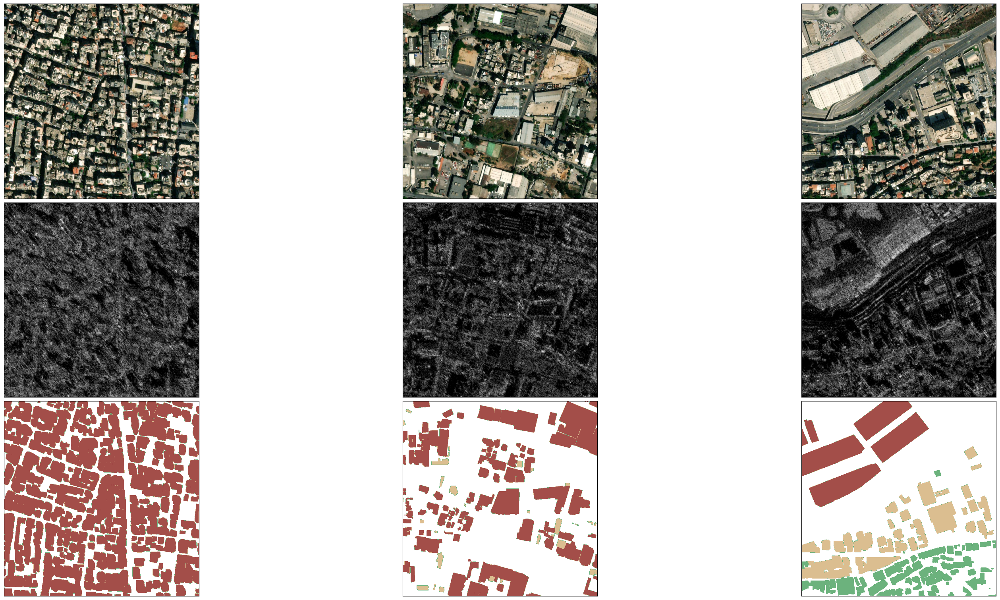

In [144]:
fig, axs = plt.subplots(3, 3, figsize=(30, 15), constrained_layout=True)

max_intact_pre = read_image(os.path.join('../../dfc25_track2_trainval/train/pre-event', earthquake_max_intact.iloc[0, 1]))
max_intact_post = read_image(os.path.join('../../dfc25_track2_trainval/train/post-event', earthquake_max_intact.iloc[0, 2]))
max_intact_mask = read_image(os.path.join('../../dfc25_track2_trainval/train/target', earthquake_max_intact.iloc[0, 0]))

max_damaged_pre = read_image(os.path.join('../../dfc25_track2_trainval/train/pre-event', earthquake_max_damaged.iloc[0, 1]))
max_damaged_post = read_image(os.path.join('../../dfc25_track2_trainval/train/post-event', earthquake_max_damaged.iloc[0, 2]))
max_damaged_mask = read_image(os.path.join('../../dfc25_track2_trainval/train/target', earthquake_max_damaged.iloc[0, 0]))

max_destroyed_pre = read_image(os.path.join('../../dfc25_track2_trainval/train/pre-event', earthquake_max_destroyed.iloc[0, 1]))
max_destroyed_post = read_image(os.path.join('../../dfc25_track2_trainval/train/post-event', earthquake_max_destroyed.iloc[0, 2]))
max_destroyed_mask = read_image(os.path.join('../../dfc25_track2_trainval/train/target', earthquake_max_destroyed.iloc[0, 0]))

axs[0, 0].imshow(max_intact_pre)
axs[1, 0].imshow(max_intact_post, cmap='gray')
axs[2, 0].imshow(max_intact_mask, cmap=cmap)

axs[0, 1].imshow(max_damaged_pre)
axs[1, 1].imshow(max_damaged_post, cmap='gray')
axs[2, 1].imshow(max_damaged_mask, cmap=cmap)

axs[0, 2].imshow(max_destroyed_pre)
axs[1, 2].imshow(max_destroyed_post, cmap='gray')
axs[2, 2].imshow(max_destroyed_mask, cmap=cmap)

for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.label_outer()

plt.subplots_adjust(wspace=0, hspace=0)

plt.show()

In [126]:
df_explosion = df_train[df_train['disaster'] == 'explosion']
df_explosion.value_counts('place')

place
beirut    116
bata       93
Name: count, dtype: int64

In [146]:
explosion_max_intact = df_explosion.sort_values('intact_ratio', ascending=False).head(1)
explosion_max_damaged = df_explosion.sort_values('damaged_ratio', ascending=False).head(1)
explosion_max_destroyed = df_explosion.sort_values('destroyed_ratio', ascending=False).head(1)

/tmp/ipykernel_1435/2959580592.py:32: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=0, hspace=0)


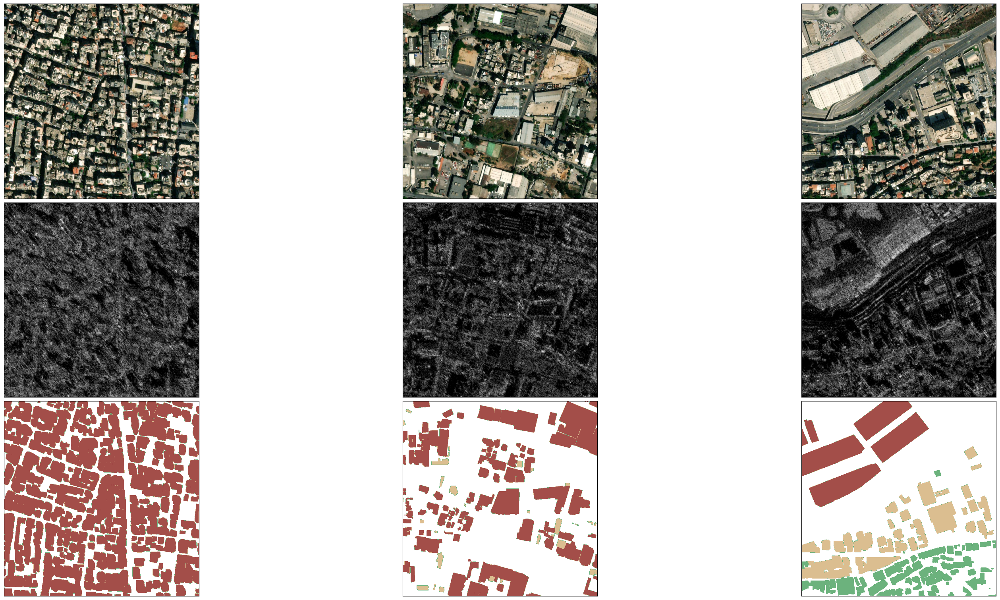

In [147]:
fig, axs = plt.subplots(3, 3, figsize=(30, 15), constrained_layout=True)

max_intact_pre = read_image(os.path.join('../../dfc25_track2_trainval/train/pre-event', explosion_max_intact.iloc[0, 1]))
max_intact_post = read_image(os.path.join('../../dfc25_track2_trainval/train/post-event', explosion_max_intact.iloc[0, 2]))
max_intact_mask = read_image(os.path.join('../../dfc25_track2_trainval/train/target', explosion_max_intact.iloc[0, 0]))

max_damaged_pre = read_image(os.path.join('../../dfc25_track2_trainval/train/pre-event', explosion_max_damaged.iloc[0, 1]))
max_damaged_post = read_image(os.path.join('../../dfc25_track2_trainval/train/post-event', explosion_max_damaged.iloc[0, 2]))
max_damaged_mask = read_image(os.path.join('../../dfc25_track2_trainval/train/target', explosion_max_damaged.iloc[0, 0]))

max_destroyed_pre = read_image(os.path.join('../../dfc25_track2_trainval/train/pre-event', explosion_max_destroyed.iloc[0, 1]))
max_destroyed_post = read_image(os.path.join('../../dfc25_track2_trainval/train/post-event', explosion_max_destroyed.iloc[0, 2]))
max_destroyed_mask = read_image(os.path.join('../../dfc25_track2_trainval/train/target', explosion_max_destroyed.iloc[0, 0]))

axs[0, 0].imshow(max_intact_pre)
axs[1, 0].imshow(max_intact_post, cmap='gray')
axs[2, 0].imshow(max_intact_mask, cmap=cmap)

axs[0, 1].imshow(max_damaged_pre)
axs[1, 1].imshow(max_damaged_post, cmap='gray')
axs[2, 1].imshow(max_damaged_mask, cmap=cmap)

axs[0, 2].imshow(max_destroyed_pre)
axs[1, 2].imshow(max_destroyed_post, cmap='gray')
axs[2, 2].imshow(max_destroyed_mask, cmap=cmap)

for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.label_outer()

plt.subplots_adjust(wspace=0, hspace=0)

plt.show()

In [168]:
df_wildfire = df_train[df_train['disaster'] == 'wildfire']

In [171]:
wildfire_max_destroyed = df_wildfire.sort_values('destroyed_ratio', ascending=False).head(1)

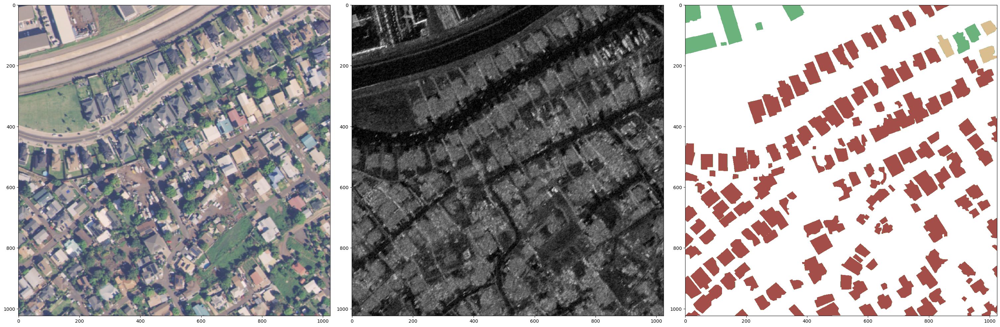

In [172]:
fig, axs = plt.subplots(1, 3, figsize=(30, 15), constrained_layout=True)

max_destroyed_pre = read_image(os.path.join('../../dfc25_track2_trainval/train/pre-event', wildfire_max_destroyed.iloc[0, 1]))
max_destroyed_post = read_image(os.path.join('../../dfc25_track2_trainval/train/post-event', wildfire_max_destroyed.iloc[0, 2]))
max_destroyed_mask = read_image(os.path.join('../../dfc25_track2_trainval/train/target', wildfire_max_destroyed.iloc[0, 0]))

axs[0].imshow(max_destroyed_pre)
axs[1].imshow(max_destroyed_post, cmap='gray')
axs[2].imshow(max_destroyed_mask, cmap=cmap)


In [174]:
df_volcano = df_train[df_train['disaster'] == 'volcano']

In [175]:
volcano_max_destroyed = df_volcano.sort_values('destroyed_ratio', ascending=False).head(1)

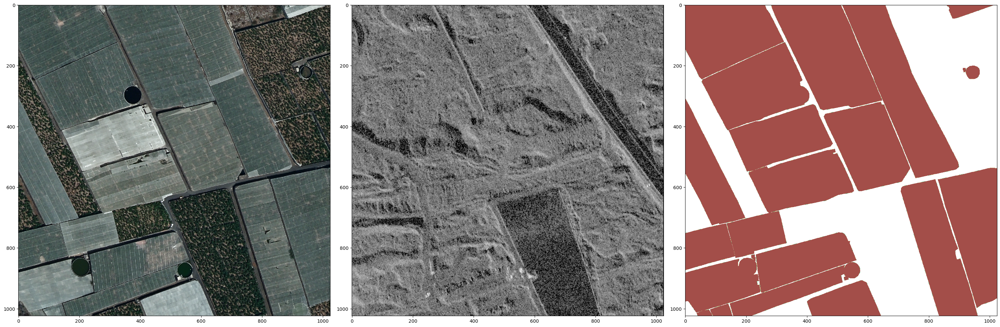

In [176]:
fig, axs = plt.subplots(1, 3, figsize=(30, 15), constrained_layout=True)

max_destroyed_pre = read_image(os.path.join('../../dfc25_track2_trainval/train/pre-event', volcano_max_destroyed.iloc[0, 1]))
max_destroyed_post = read_image(os.path.join('../../dfc25_track2_trainval/train/post-event', volcano_max_destroyed.iloc[0, 2]))
max_destroyed_mask = read_image(os.path.join('../../dfc25_track2_trainval/train/target', volcano_max_destroyed.iloc[0, 0]))

axs[0].imshow(max_destroyed_pre)
axs[1].imshow(max_destroyed_post, cmap='gray')
axs[2].imshow(max_destroyed_mask, cmap=cmap)